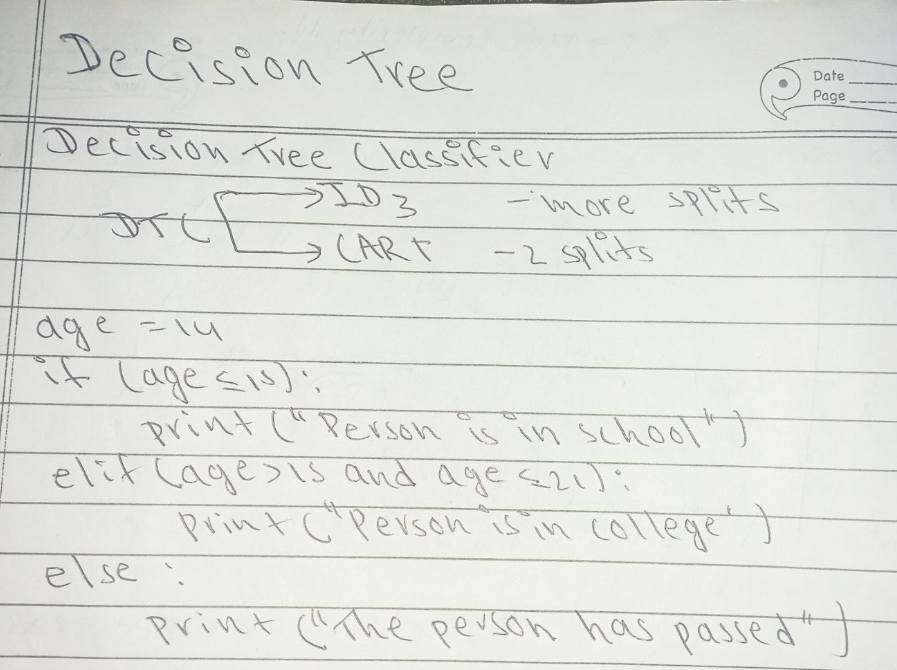

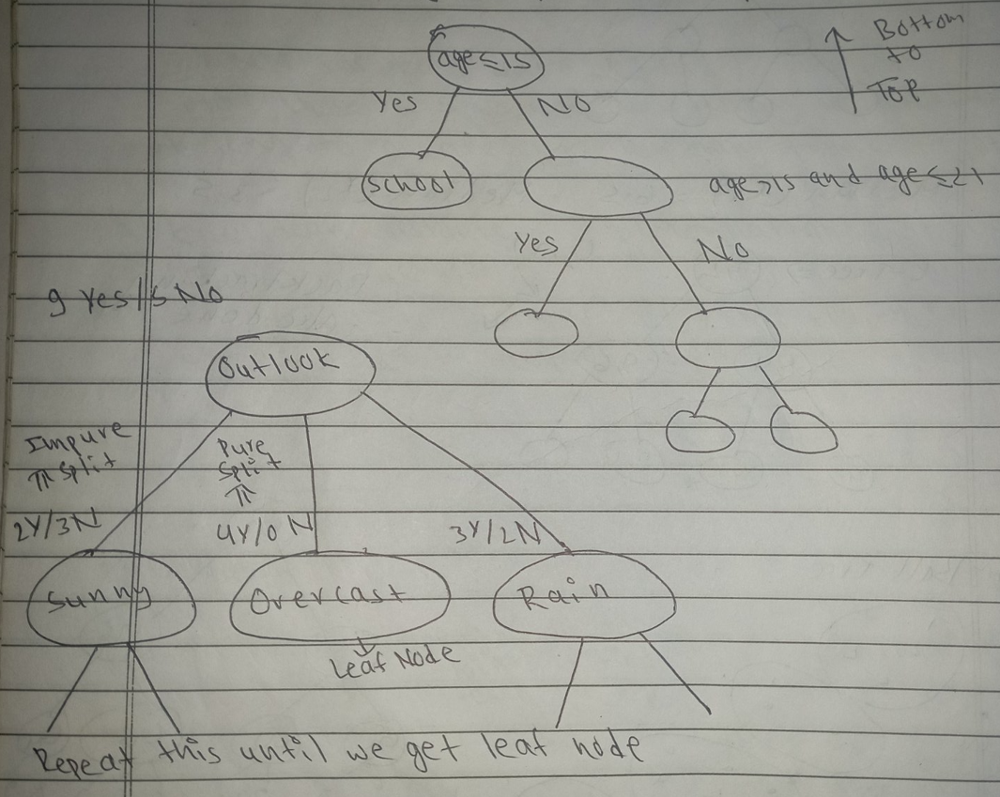

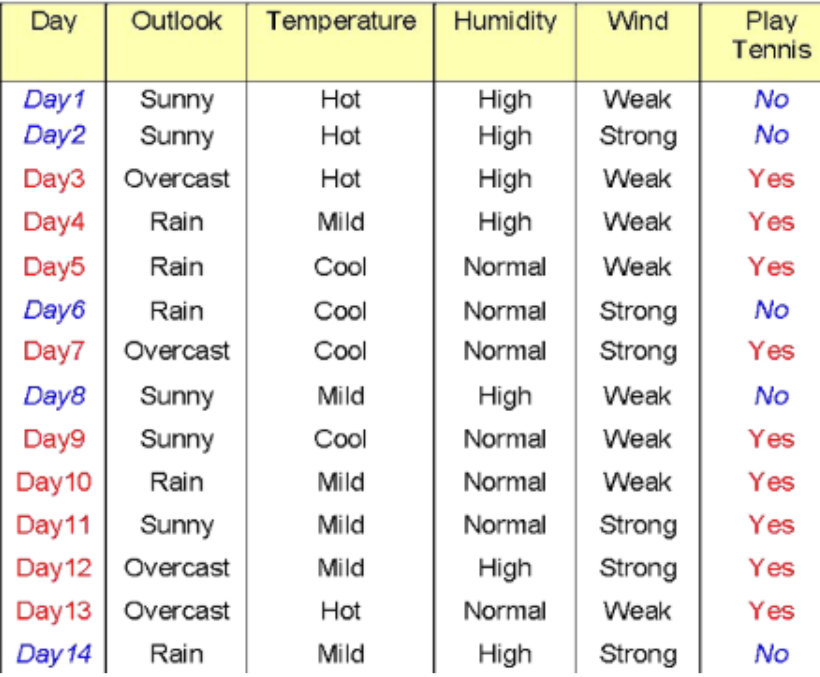

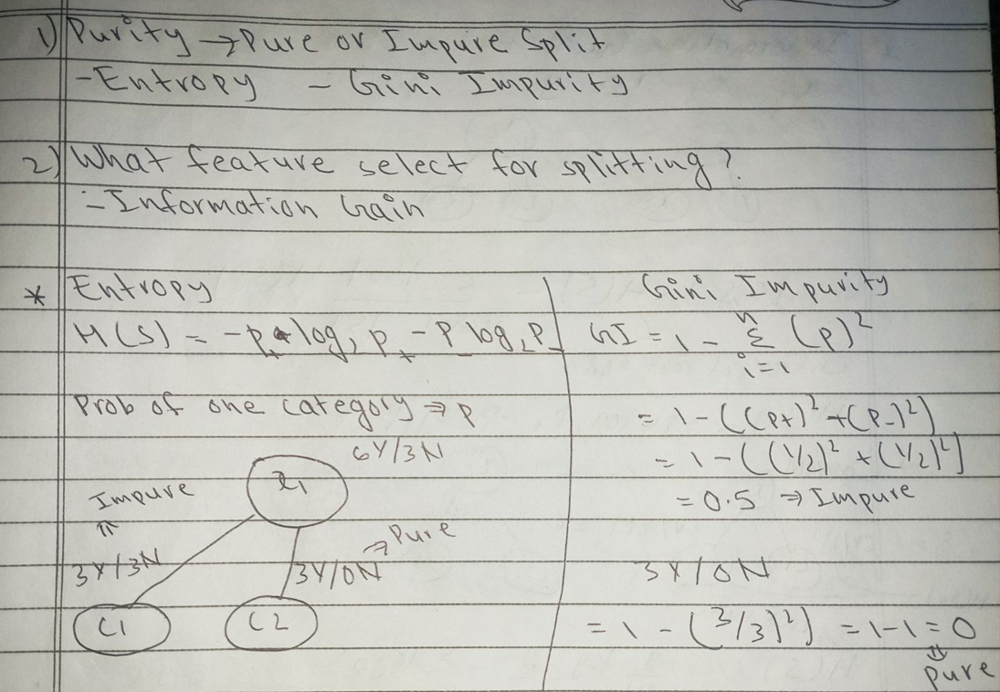

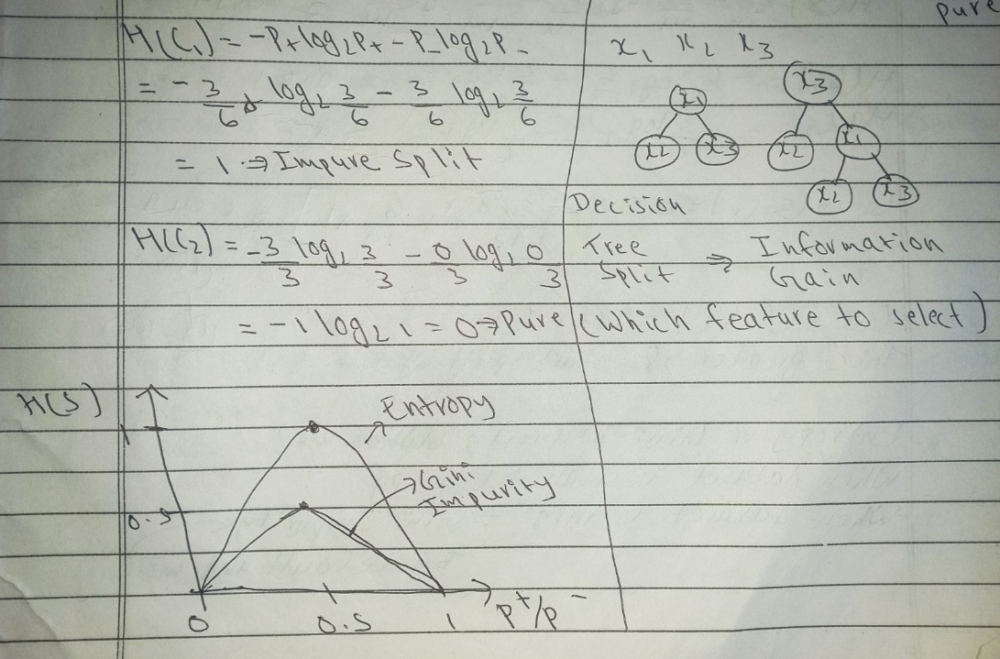

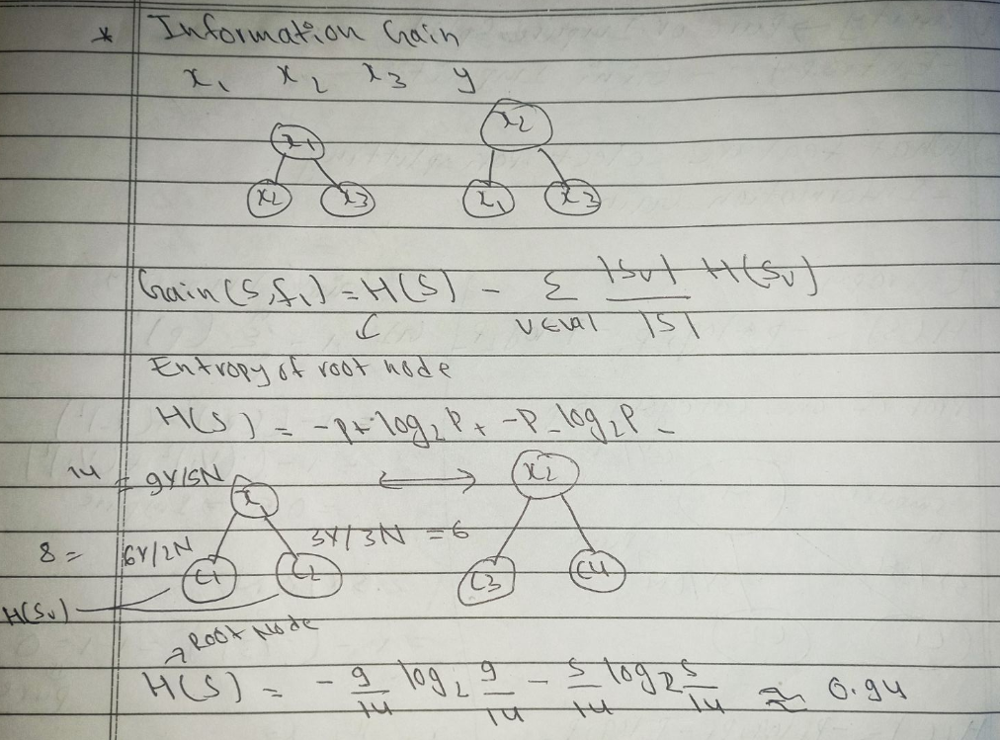

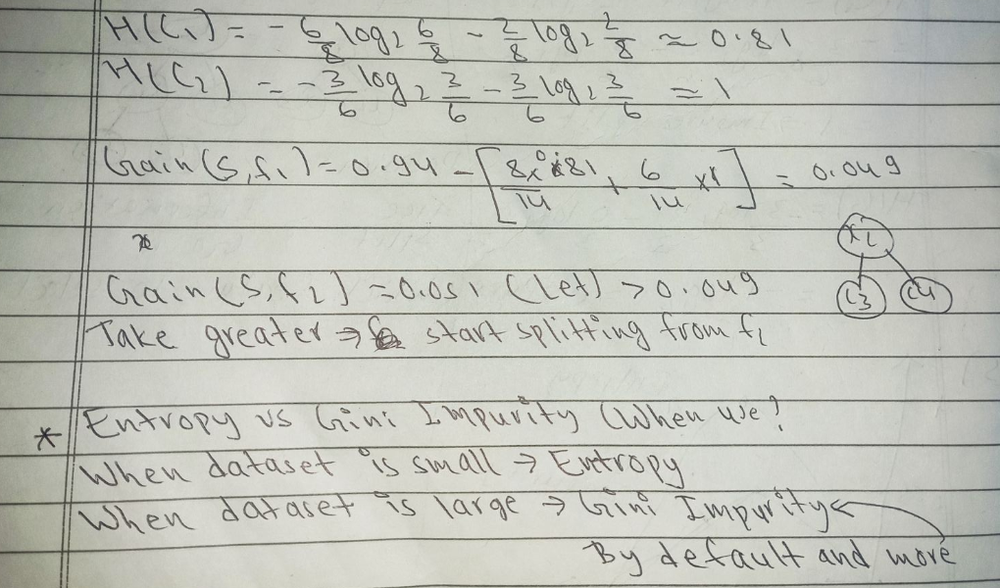

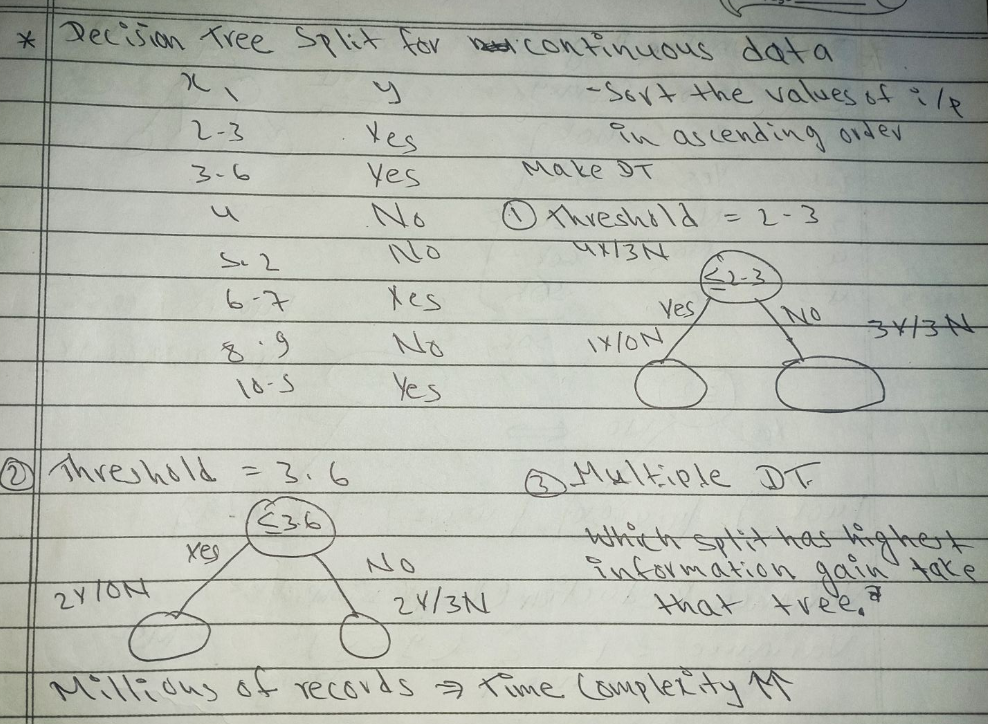

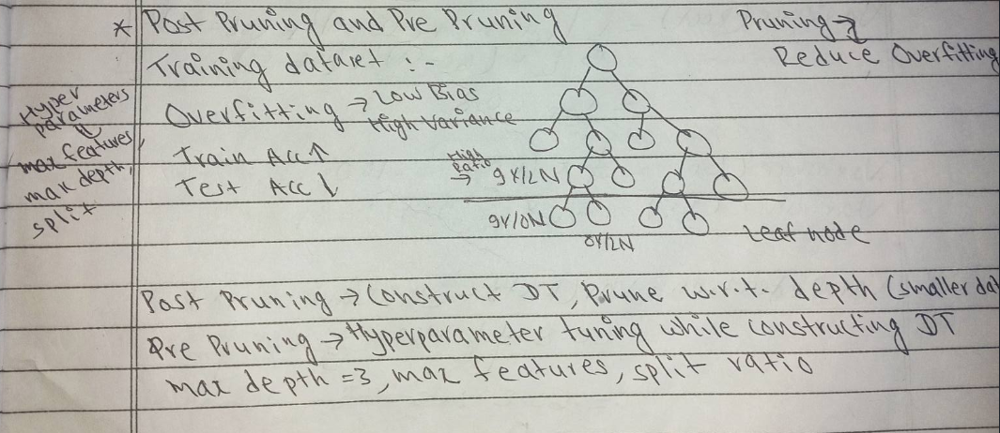

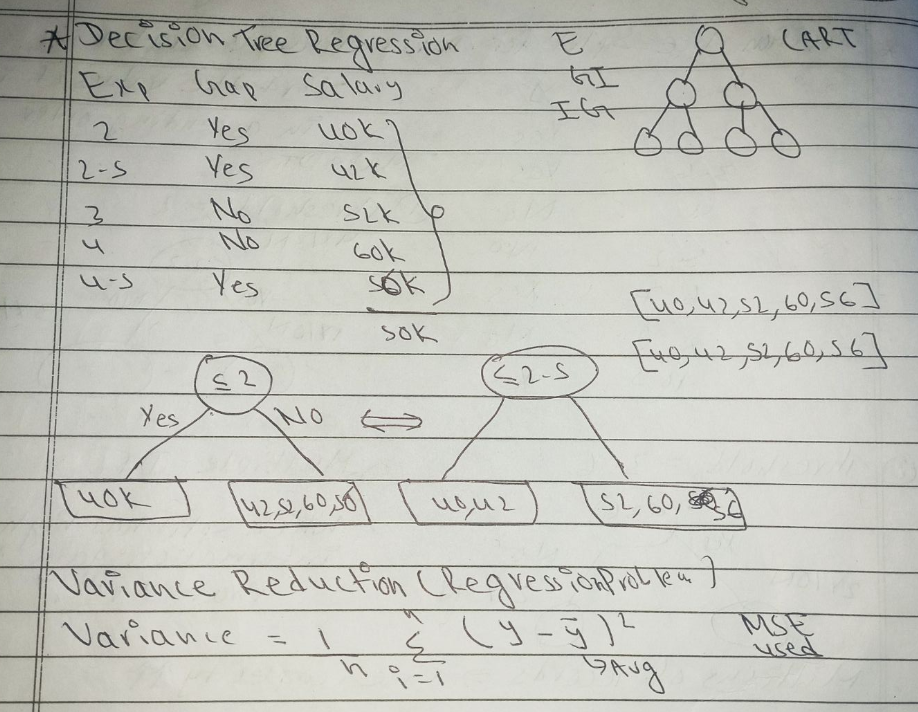

y si individual data of salray that is to be predicte and y bar is average

talako 50 is average value in salary column

dt regressor ko output features ko valu eis continuous and
cart ma binary split hunxa

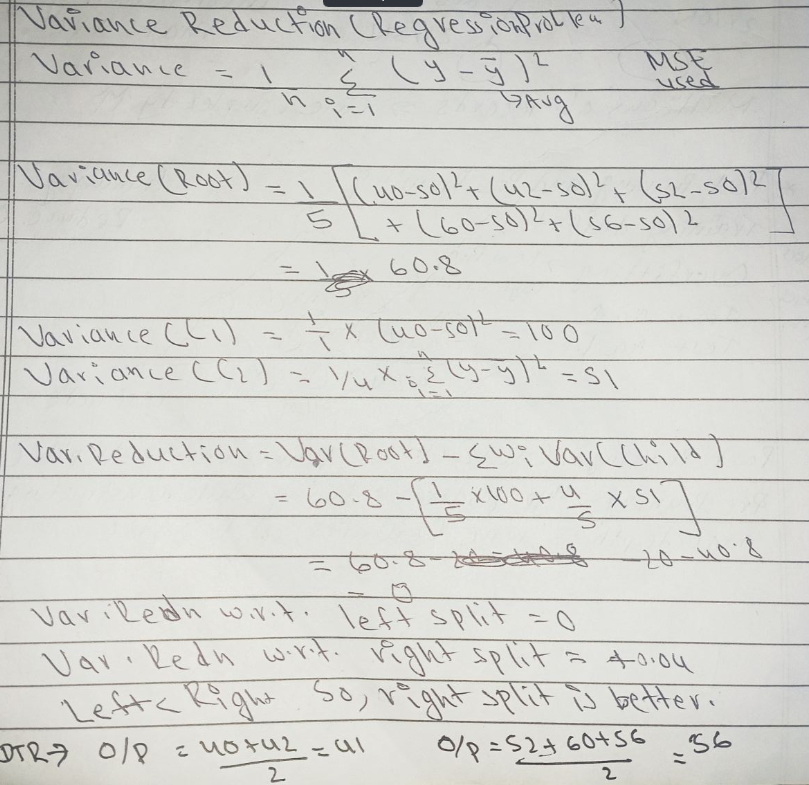

c1 is child node and c2 is another child node

Diabetes Predictions

In [ ]:
from sklearn.datasets import load_diabetes

In [ ]:
dataset = load_diabetes()

In [ ]:
dataset

In [ ]:
print(dataset.DESCR)

In [ ]:
dataset

In [ ]:
print(dataset['DESCR'])

In [ ]:
import pandas as pd
df = pd.DataFrame(dataset['data'], columns=dataset['feature_names'])

In [ ]:
df.head()

In [ ]:
# Independent and dependent features
X = df
y = dataset['target']


dont we need to make separate column for target in datafeame
No, it's generally recommended to keep the target variable (y) separate from your feature DataFrame (X). This distinction is important for machine learning models, as they are trained to predict y based on X. Libraries like scikit-learn expect X to be a matrix of features and y to be a vector of target values, so separating them now is good practice.



In [ ]:
dataset['target']

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
X_train.head()

In [ ]:
# Correlation
X_train.corr()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
sns.heatmap(X_train.corr(), annot = True)

In [ ]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor()
model.fit(X_train, y_train)

mmain documentation haru herna parxa re

Hyperparameter Tuning

In [ ]:
param = {
    'criterion' : ['squared_error', 'friedman_mse', 'absolute_error'],
    'splitter' : ['best', 'random'],
    'max_depth' : [1, 2, 3, 4, 5, 10, 15, 20, 25],
    'max_features' : ['auto', 'sqrt', 'log2']
}

In [ ]:
param

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
model = DecisionTreeRegressor()

In [ ]:
grid = GridSearchCV(model, param_grid=param)

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
grid.fit(X_train, y_train)

In [ ]:
grid.best_params_

In [ ]:
## Prediction
y_pred = grid.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [ ]:
print(f'Mean Squared Error: {mean_squared_error(y_test, y_pred)}')
print(f'R2 Score: {r2_score(y_test, y_pred)}')
print(f'Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}')

r2 score is m0.26

In [ ]:
model = DecisionTreeRegressor(criterion='friedman_mse', max_depth=2, max_features='log2', splitter='best')

In [ ]:
model.fit(X_train, y_train)

In [ ]:
# Visualizing the Decision Tree
import matplotlib.pyplot as plt
from sklearn import tree
plt.figure(figsize=(20, 10))
tree.plot_tree(model, filled = True)
plt.show()

Let's break down what you're seeing in that decision tree diagram, node by node, in a simple way:

Each box you see is called a 'node'. It represents a decision point or an end result.

The very top line in a node (e.g., feature <= threshold or x[2] <= 0.005): This is the decision rule or question. The tree looks at one of your independent features (like x[2]) and asks if its value is less than or equal to a certain number (like 0.005).

If the answer is True (the condition is met), the data goes to the left child node.
If the answer is False (the condition is not met), the data goes to the right child node.
friedman_mse: This is a measure of how 'mixed up' the values are in that node. Think of it like this: if all the samples in a node have very similar target values, the friedman_mse will be low. If they are very different, it will be high. The tree tries to make splits that reduce this number, making the nodes more 'pure' (more similar values).

samples: This tells you how many data points from your dataset ended up in this particular node. For example, if it says samples = 100, it means 100 data points followed the path through the tree to reach this node.

value: This is the prediction that the tree would make if this node were a leaf node (an end node with no more splits). It's essentially the average target value of all the samples that fall into that node. For instance, value = 153.03 means if a data point ends up here, the tree predicts its target value to be 153.03.

filled = True (the colors): The colors of the boxes help visualize the predicted value. Darker or different shades usually indicate different predicted values, giving you a quick visual cue about the tree's output at various points.

In essence, the tree starts at the top, asks a series of 'yes/no' questions based on your features, and directs each data point down a specific path until it reaches a node where it can make a prediction (value).



samples=total vayo
value vaneko tyo node ma chai 153.03 or 205.532 predict garne raixa

x[2] vaneko x ko 7 no ko feature vanera bhujne,tyo 0.005 vanda kam xa or true vayema split hunxa natra false ma janxa

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
print(f'Mean Squared Error: {mean_squared_error(y_test, y_pred)}')
print(f'R2 Score: {r2_score(y_test, y_pred)}')
print(f'Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}')